## 1. Exploration

An exploratory analysis is performed using descriptive statistics and data visualization. Features are grouped according to their column names (chroma cens, chroma cqt, chroma stft, mfcc, rmse, spectral bandwidth, spectral centroid, spectral contrast, spectral rolloff, tonnetz, zcr).

1. For each target, an overview of a subsample of the data is visualized using an interactive PCA plot.
2. Mean, median, standard deviation, and quantiles are reported for features and targets.
3. The distributions of the features are visualized with violin plots. The distributions of the targets are visualized with histograms, on which a density estimate is plotted.
4. The features are assessed on covariance and correlation using heatmaps.
5. Missing data is reported for each variable and assessed on randomness. Duplicates are reported as well.

(Choice to conceptualize listens as popularity.)

### Setup

In [11]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from scipy.stats import pearsonr

import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
import plotly.express as px

sns.set_theme()

In [12]:
# Read data
df = pd.read_csv('data/data_train.csv')
df_meta = pd.read_csv('data/metadata_train.csv', parse_dates=['album_date_created', 'album_date_released']) #There are more datetimes

df.drop(df.columns[[0,1]],axis=1,inplace=True)
df['popularity'] = df_meta['track_listens']
df['release'] = df_meta['album_date_released']

In [33]:
class Feature_reader():
    """
    Each feature has a first name, optionally a second name, a statistic and a number.
    This class allows to group feautures according to these aspects or combinations of these aspects.
    Each method produces a list of feature names or a list of lists of feature names.
    """

    def __init__(self, csv):
        self.fts = pd.read_csv(csv, dtype={'n':"string"})
        self.fts = self.fts.fillna('')

    def format(self, select):
        return select.apply(lambda x: '_'.join(x).replace('__', '_'), axis=1).tolist()

    def all(self):
        select = self.fts.copy()
        return self.format(select)

    def first(self):
        select = self.fts.copy()
        select = select.loc[select['n']=='01']
        return self.format(select)

    def per_s(self):
        select = self.fts.copy()
        select = select.loc[select['n']=='01']
        return self.format(select)

    def kurtosis(self):
        select = self.fts.copy()
        select = select.loc[select['stat']=='kurtosis']
        return self.format(select)

    def mean(self):
        select = self.fts.copy()
        select = select.loc[select['stat']=='mean']
        return self.format(select)

    def per_nns(self):
        """
        List of lists per name1, name2, stat, per name1, name2.
        """
        select = self.fts.copy()
        select = [[self.format(grp2) for idx2, grp2 in grp.groupby(by=['stat'], sort=False)] for idx, grp in select.groupby(by=['name1', 'name2'])]
        return select
    
    def per_sn(self):
        """
        List of lists per stat, n. 
        """
        select = self.fts.copy()
        select = [[self.format(grp2) for idx2, grp2 in grp.groupby(by=['n'], sort=False)] for idx, grp in select.groupby(by=['stat'], sort=False)]
        return select

fts = Feature_reader('features.csv')

### 1.1 Dimensionality reduction
To get a first exploratory idea of the features, for each targ the data is binned and visualized using PCA dimensionality reduction. The plot is interactive, such that different bins can be compared.
(Tested both without binning, creating a continuous plot, and with. Chose to present with binning for interpretability and the option to show and hide datapoints from a specific bin with plotly.)

Source: https://plotly.com/python/pca-visualization/

#### Popularity

In [4]:
bins = [0, 10, 100, 1000, 10000, 100000, 1000000]
labels = ["1s", "10s", "100s", "1000s", "10.000s", "100.000s"]

df['popularity_bins'] = pd.cut(df['popularity'], bins=bins, labels=labels, right=False)
df['popularity_bins'] = df['popularity_bins'].cat.add_categories('unknown').fillna('unknown')

pca = PCA(n_components=2)
components = pca.fit_transform(df[fts.all()])

fig = px.scatter(components, x=0, y=1, color=df['popularity_bins'])
fig.show()

#### Release

In [5]:
bins = [1900, 1960, 1970, 1980, 1990, 2000, 2010, 2020, 2022]
labels = ['<1960', "'60s", "'70s", "'80s", "'90s", "'00s", "'10s", ">2020"]

df['release_bins'] = pd.cut(df['release'].dt.year, bins=bins, labels=labels, right=False)
df['release_bins'] = df['release_bins'].cat.add_categories('unknown').fillna('unknown')

pca = PCA(n_components=2)
components = pca.fit_transform(X=df[fts.all()])

fig = px.scatter(components, x=0, y=1, color=df['release_bins'])
fig.show()

### 1.2 Statistics

#### Features

In [6]:
print(df[fts.first()].describe())

       chroma_cens_kurtosis_01  chroma_cens_max_01  chroma_cens_mean_01  \
count             85259.000000        85259.000000         85259.000000   
mean                  0.489624            0.622444             0.257024   
std                  36.047869            0.086078             0.081427   
min                  -1.955806            0.040076             0.000006   
25%                  -0.636098            0.571438             0.207122   
50%                  -0.176151            0.641683             0.254912   
75%                   0.484612            0.684384             0.303038   
max                8843.367188            1.000000             0.838846   

       chroma_cens_median_01  chroma_cens_min_01  chroma_cens_skew_01  \
count           85259.000000        85259.000000         85259.000000   
mean                0.248574            0.009472             0.253991   
std                 0.095219            0.032378             0.813461   
min                 0.000000    

#### Targets

In [7]:
# Targets
print(df.popularity.describe())
print('')
print(df.release.describe(datetime_is_numeric=True))

count     85259.000000
mean       2316.089011
std        7989.535783
min           0.000000
25%         293.000000
50%         765.000000
75%        2013.000000
max      543252.000000
Name: popularity, dtype: float64

count                            56344
mean     2011-03-31 01:43:38.088882432
min                1902-01-01 00:00:00
25%                2009-04-15 00:00:00
50%                2011-12-29 00:00:00
75%                2014-04-01 00:00:00
max                2021-03-01 00:00:00
Name: release, dtype: object


### 1.3 Distributions

#### Features
The visualization of the distributions of the feautures are grouped by `first_name, second_name` per row, and a `statistic` per column. This allows to compare the features per `number`. Observations:
- For all `chroma` features, there is not much difference between feautures of different `number`, only in the outliers. This would suggest that selecting or sampling one feature per `chroma_[second_name]_statistic_number` suffices.
- For the `mffc` features, the `number` feautures seem to converge, to a certain mean, with the first `number` feature differing the most from other features.
- For the `tonnetz` features, for the `statistic` features mean, median, min, max, and std, `number` 3 and 4 differs from the other `number` features.

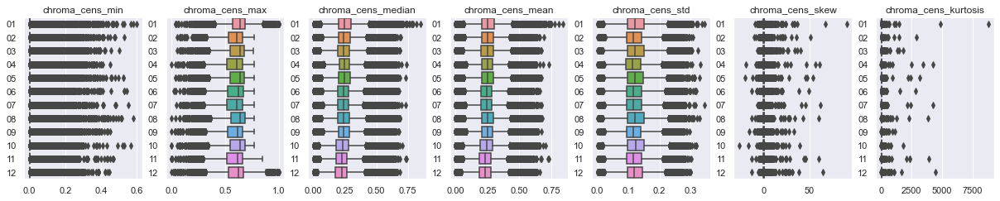

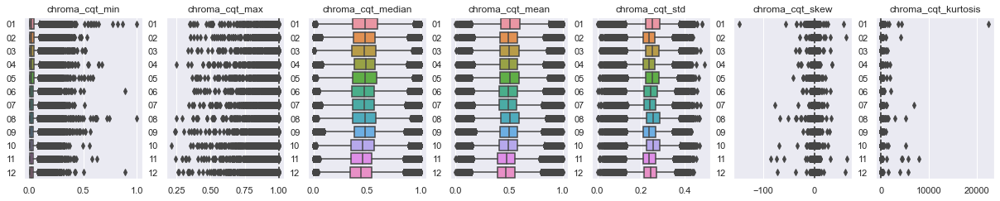

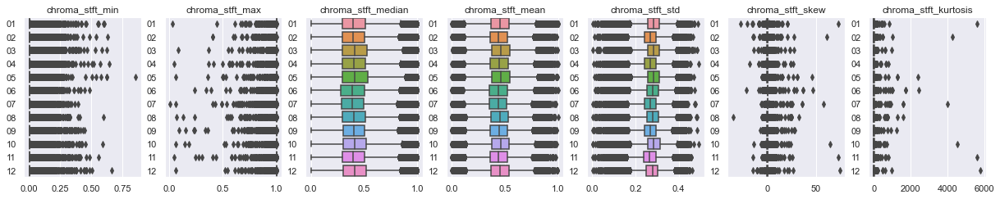

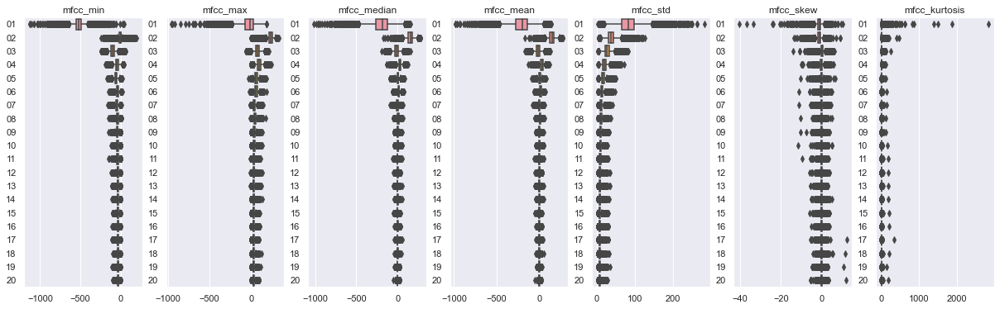

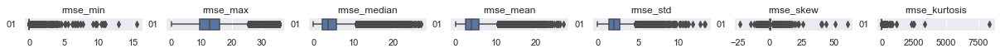

...

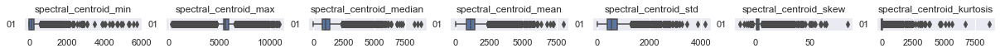

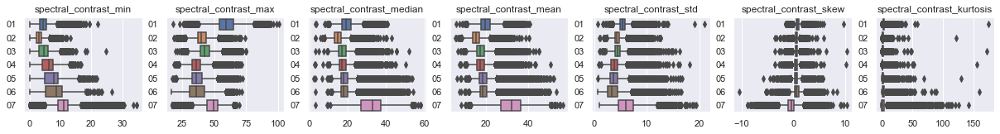

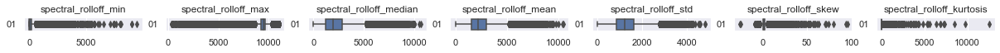

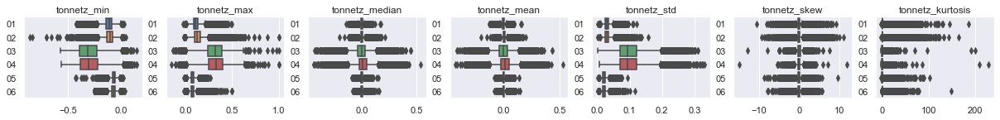

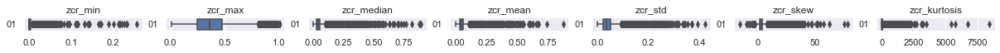

In [16]:
fts_groups = fts.per_nns()

for fnn_group in fts_groups:
    n = len(fnn_group[0])
    c, r = 7, 1
    fig, axs = plt.subplots(ncols=c, nrows=r, figsize=(3*c, 3*r*0.1*n))

    for i in range(c):
        fnns_group = fnn_group[i]
        ax = sns.boxplot(data=df[fnns_group], orient='h', ax=axs[i])

        title = "_".join(fnns_group[0].split("_")[:-1])
        ax.set(title=title)
        y_ticks = [n.split('_')[-1] for n in fnns_group]
        ax.set_yticklabels(y_ticks)
    
fig;

#### Targets

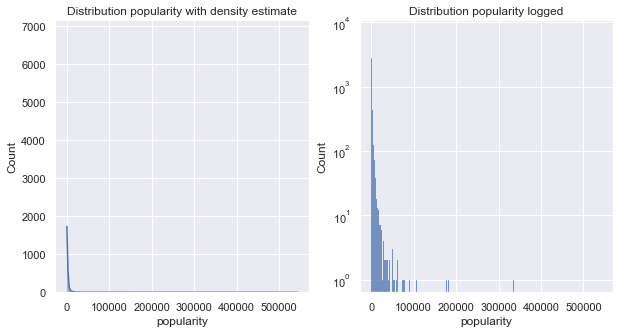

In [56]:
fig, axs = plt.subplots(ncols=2, figsize=(10,5))

ax1 = sns.histplot(data=df, x="popularity", kde=True, ax=axs[0])
ax1.set(title="Distribution popularity with density estimate")

ax2 = sns.histplot(data=df, x="popularity", log_scale=(False, True), ax=axs[1])
ax2.set(title="Distribution popularity logged")

fig;

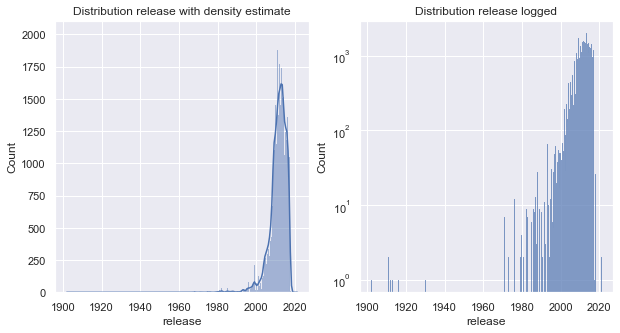

In [57]:
fig, axs = plt.subplots(ncols=2, figsize=(10,5))

ax1 = sns.histplot(data=df, x="release", kde=True, ax=axs[0])
ax1.set(title="Distribution release with density estimate")

ax2 = sns.histplot(data=df, x="release", log_scale=(False, True), ax=axs[1])
ax2.set(title="Distribution release logged")

fig;

### 1.4 Covariance and correlation


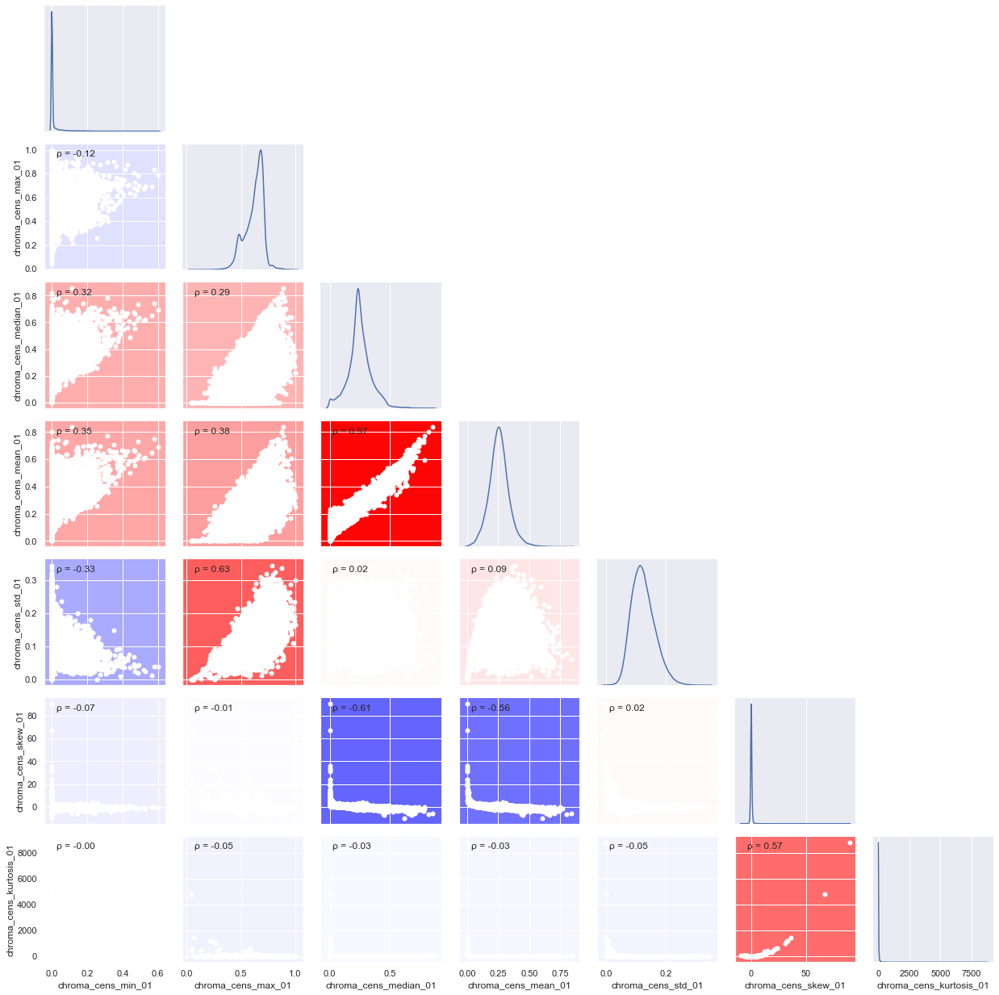

In [97]:
# per name_1, name_2, stat, first

cm = plt.cm.bwr
cnorm = colors.Normalize(vmin=-1, vmax=1)
smap = plt.cm.ScalarMappable(norm=cnorm, cmap=cm)

def corrfunc(x, y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r, _ = pearsonr(x, y)
    ax = ax or plt.gca()
    ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)
    ax.set_facecolor(smap.to_rgba(r))

fig = sns.PairGrid(df[fts.first()[:7]], diag_sharey=False, corner=True)
fig.map_diag(sns.kdeplot)
fig.map_lower(sns.scatterplot, color = 'w', linewidth = 0)
fig.map_lower(corrfunc)

fig;

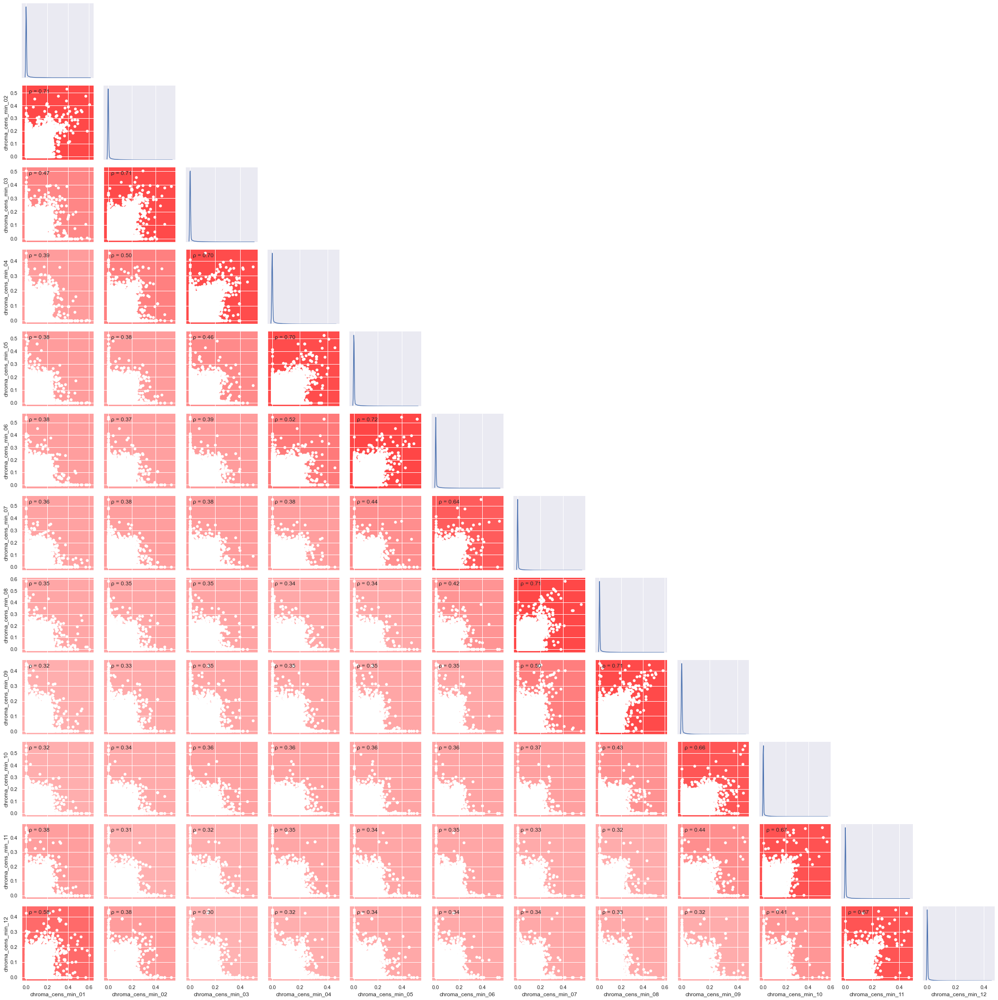

In [98]:
# per name_1, name_2, stat, n

cm = plt.cm.bwr
cnorm = colors.Normalize(vmin=-1, vmax=1)
smap = plt.cm.ScalarMappable(norm=cnorm, cmap=cm)

def corrfunc(x, y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r, _ = pearsonr(x, y)
    ax = ax or plt.gca()
    ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)
    ax.set_facecolor(smap.to_rgba(r))

fig = sns.PairGrid(df[fts.all()[0:12]], diag_sharey=False, corner=True)
fig.map_diag(sns.kdeplot)
fig.map_lower(sns.scatterplot, color = 'w', linewidth = 0)
fig.map_lower(corrfunc)

fig;

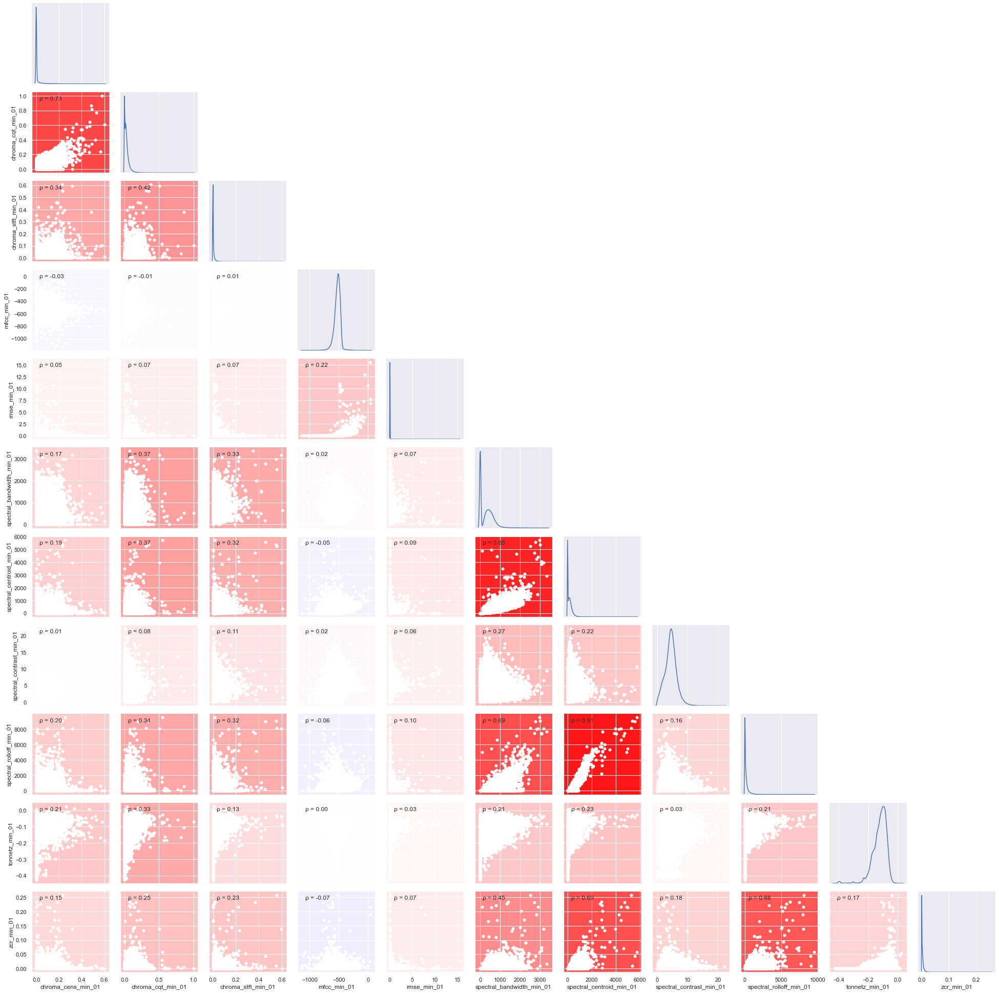

In [99]:
# stat, first

cm = plt.cm.bwr
cnorm = colors.Normalize(vmin=-1, vmax=1)
smap = plt.cm.ScalarMappable(norm=cnorm, cmap=cm)

def corrfunc(x, y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r, _ = pearsonr(x, y)
    ax = ax or plt.gca()
    ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)
    ax.set_facecolor(smap.to_rgba(r))

fig = sns.PairGrid(df[fts.per_sn()[0][0]], diag_sharey=False, corner=True)
fig.map_diag(sns.kdeplot)
fig.map_lower(sns.scatterplot, color = 'w', linewidth = 0)
fig.map_lower(corrfunc)

fig;

### 1.5 Missing values and duplicated values

In [16]:
print(f'\nNAs: {df_meta.track_listens.isna().sum()}')
print(f'infs: {df_meta.track_listens.isin([np.inf, -np.inf]).values.sum()}')
# histplot throws an error for a seemingly inf number though

nulls = df_meta.album_date_released.isnull().sum()
total = df_meta.album_date_released.size
print(f'\nNAs: {nulls}/{total}: {round(nulls/total, 3)} %')

# df_meta_2 = df_meta.dropna(subset='album_date_released')

print(df.isna().sum().sum())
print(df.duplicated().sum())

0
0
